# Latent Consistency Model (LCM) の実装

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/py-img-gen/python-image-generation/blob/main/notebooks/5-4-2_latent-consistency-model.ipynb)

参考: https://hf.co/docs/diffusers/using-diffusers/inference_with_lcm

## 準備

In [1]:
!pip install -qq py-img-gen

In [2]:
import warnings

import torch

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
dtype = torch.float16
variant = "fp16"
seed = 19950815

warnings.simplefilter("ignore", FutureWarning)

## 通常の SDXL による画像生成

In [3]:
from diffusers import StableDiffusionXLPipeline

model_id = "stabilityai/stable-diffusion-xl-base-1.0"

pipe_slow = StableDiffusionXLPipeline.from_pretrained(
    model_id, torch_dtype=dtype, variant=variant
)
pipe_slow = pipe_slow.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

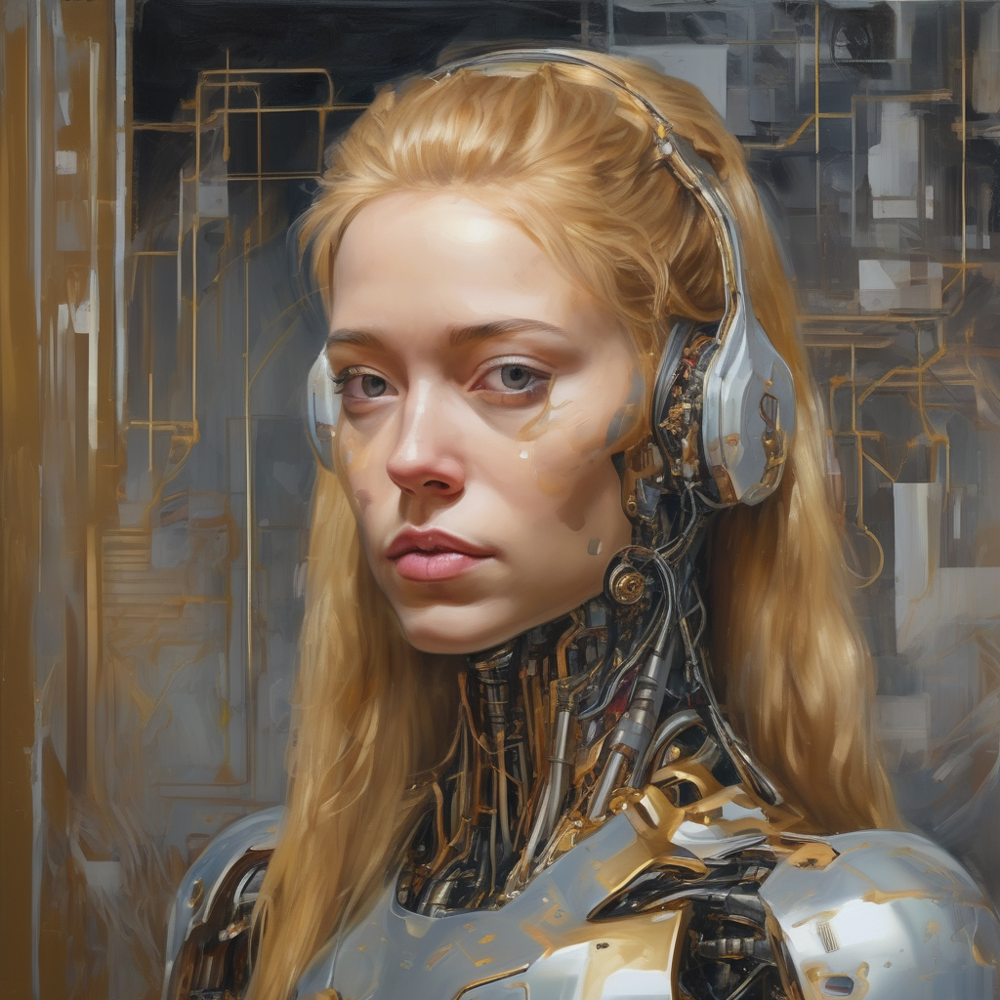

In [4]:
prompt = "Self-portrait oil painting, a beautiful cyborg with golden hair, 8k"
image_slow = pipe_slow(
    prompt=prompt,
    num_inference_step=50,
    generator=torch.manual_seed(seed),
).images[0]

image_slow

## LCM を導入した SDXL による画像生成

In [5]:
from diffusers import LCMScheduler, UNet2DConditionModel

# LCM に対応した UNet の読み込み
unet = UNet2DConditionModel.from_pretrained(
    "latent-consistency/lcm-sdxl",
    torch_dtype=dtype,
    variant=variant,
)
pipe_fast = StableDiffusionXLPipeline.from_pretrained(
    model_id,
    unet=unet,
    torch_dtype=dtype,
    variant=variant,
)
pipe_fast = pipe_fast.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [6]:
pipe_fast.scheduler = LCMScheduler.from_config(
    pipe_fast.scheduler.config
)

The config attributes {'skip_prk_steps': True} were passed to LCMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


  0%|          | 0/4 [00:00<?, ?it/s]

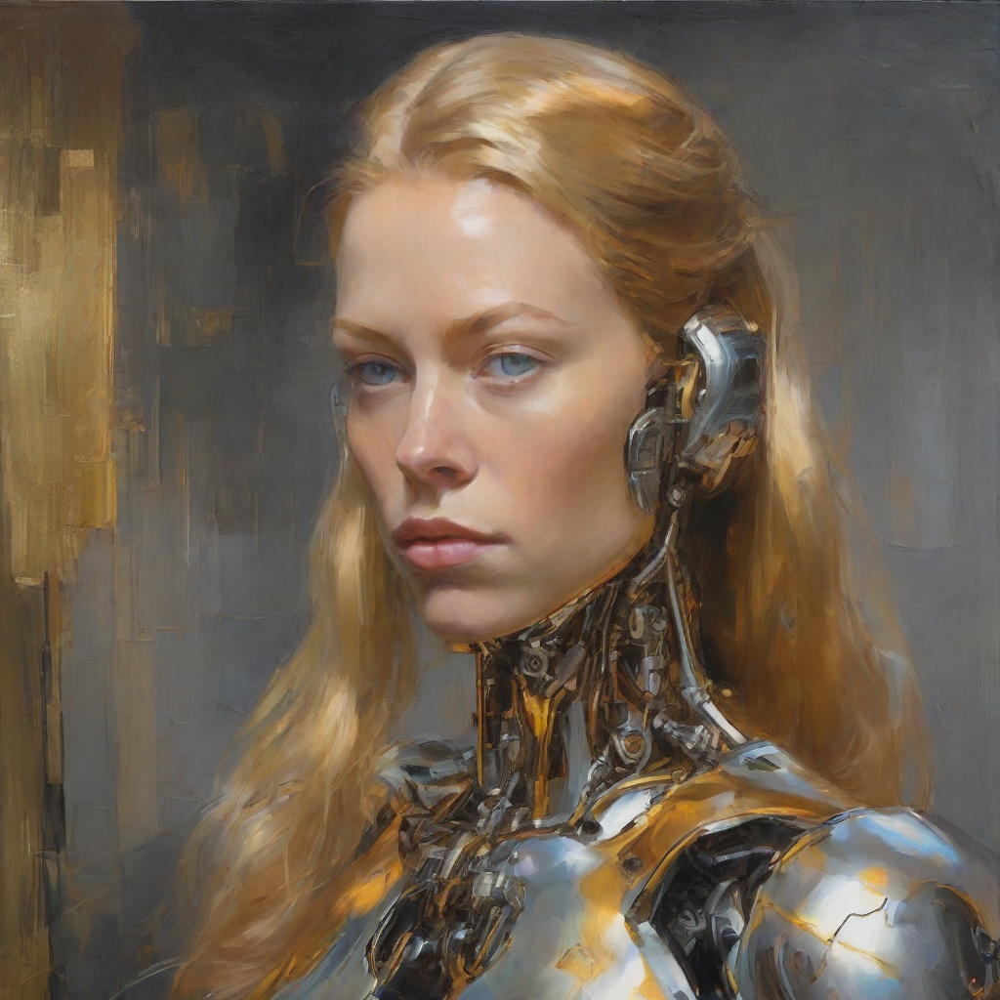

In [7]:
image_fast = pipe_fast(
    prompt=prompt,
    num_inference_steps=4,
    guidance_scale=8.0,
    generator=torch.manual_seed(seed),
).images[0]

image_fast

## 生成品質の比較

### LCM の有無による生成品質の比較

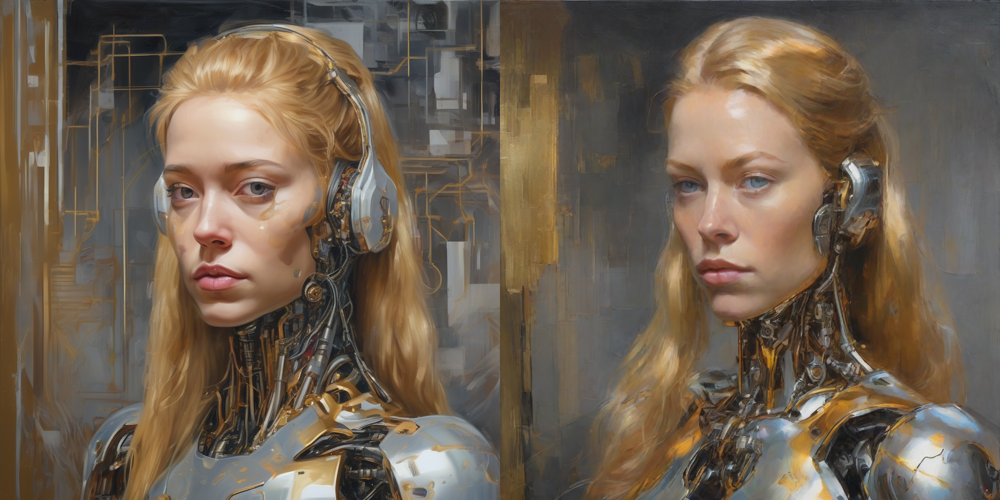

In [8]:
from diffusers.utils import make_image_grid

make_image_grid([image_slow, image_fast], rows=1, cols=2)

### ステップ数を LCM に合わせたときの生成品質の比較

In [9]:
image_slow = pipe_slow(
    prompt=prompt,
    num_inference_steps=4,
    generator=torch.manual_seed(seed),
).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

In [10]:
image_fast = pipe_fast(
    prompt=prompt,
    num_inference_steps=4,
    guidance_scale=8.0,
    generator=torch.manual_seed(seed),
).images[0]

  0%|          | 0/4 [00:00<?, ?it/s]

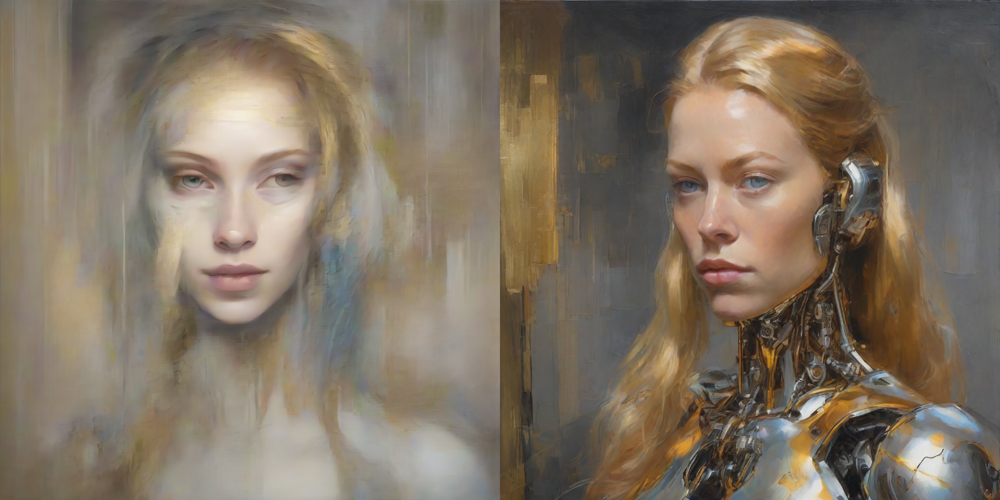

In [11]:
make_image_grid([image_slow, image_fast], rows=1, cols=2)